### For running the code:
### Please download the folder namely "test" and "train_smoothed" from:
### https://drive.google.com/drive/folders/11_eslqoFwZHzZ2fxrrB6qXca8pXfSAzD
### And then start running the code from section 1.3 below

# 1. Data Preprocessing

## 1.1 Train-Test Split

In [24]:
import os
import shutil
import random

# raw data path
input_folder = '/Users/leewaiyip/Desktop/selected_artist'

# train test split ratio
train_ratio = 0.9

# output path for train and test data
train_folder = '/Users/leewaiyip/Desktop/train'
test_folder = '/Users/leewaiyip/Desktop/test'

# Iterate over each subfolder in the raw data folder
for subfolder_name in os.listdir(input_folder):
    
    # raw data path + subfolder's name
    subfolder_path = os.path.join(input_folder, subfolder_name)
    
    # Check if the subfolder is actually a folder (and not a file)
    if os.path.isdir(subfolder_path):
        
        # Get a list of all the image file names in the subfolder
        image_filenames = os.listdir(subfolder_path)
        
        # Shuffle the image filenames randomly
        random.shuffle(image_filenames)
        
        # Determine the split point between train and test sets
        split_point = int(len(image_filenames) * train_ratio)
        
        # Split the image filenames into train and test sets
        train_image_filenames = image_filenames[:split_point]
        test_image_filenames = image_filenames[split_point:]
        
        # Construct the full paths to the output train and test subfolders
        output_train_subfolder = os.path.join(train_folder, subfolder_name)
        output_test_subfolder = os.path.join(test_folder, subfolder_name)
        
        # Create the output train and test subfolders if they don't already exist
        os.makedirs(output_train_subfolder, exist_ok=True)
        os.makedirs(output_test_subfolder, exist_ok=True)
        
        # Iterate over the train image filenames and copy them to the output train subfolder
        for train_image_filename in train_image_filenames:
            input_path = os.path.join(subfolder_path, train_image_filename)
            output_path = os.path.join(output_train_subfolder, train_image_filename)
            shutil.copyfile(input_path, output_path)
            
        # Iterate over the test image filenames and copy them to the output test subfolder
        for test_image_filename in test_image_filenames:
            input_path = os.path.join(subfolder_path, test_image_filename)
            output_path = os.path.join(output_test_subfolder, test_image_filename)
            shutil.copyfile(input_path, output_path)


## 1.2 Gaussian and Bilateral Smoothing on Training Dataset

In [4]:
cd /Users/leewaiyip/Desktop/train_smoothed

/Users/leewaiyip/Desktop/train


In [2]:
import os
import cv2

listname = ['Alfred_Sisley/','Francisco_Goya/', 'Marc_Chagall/','Paul_Gauguin/','Paul_Klee/','Rembrandt/','Rene_Magritte/','Titian/'] 

for direc in listname:
    file = []
    for filename in os.listdir(direc):              #read all filenames under the folder
        file.append(filename)
    for name in file:                               #for each file, read and smooth it
        img = cv2.imread(direc+name)
        if img is None:
            continue
        gauss = cv2.GaussianBlur(img,(5,5),4)
        bilater = cv2.bilateralFilter(img,10,47,38)
        picname_gauss = name.replace('.jpg','_gauss')
        picname_bilat = name.replace('.jpg','_bilateral')
        cv2.imwrite(direc+picname_gauss+".jpg", gauss)
        cv2.imwrite(direc+picname_bilat+".jpg", bilater)

## 1.3 Train Validation Split for model training

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from tensorflow_addons.layers import InstanceNormalization
from PIL import Image
from tensorflow.keras.layers import Conv2D, LSTM, Dense, Flatten, Dropout, MaxPooling2D, Activation, TimeDistributed,BatchNormalization

In [3]:
# Change the directory of the raw dataset
np.random.seed(6)
data_dir = '/Users/leewaiyip/Desktop/train_smoothed'
batch_size = 32

class_names = ['Alfred_Sisley','Francisco_Goya', 'Marc_Chagall','Paul_Gauguin',
            'Paul_Klee','Rembrandt','Rene_Magritte','Titian'] 

train_datagen = ImageDataGenerator(
    rescale=1./255,      # normalize pixel values between 0 to 1
    validation_split=0.2
)

# use the flow_from_directory method to import the images from the directories
train_data = train_datagen.flow_from_directory(
    data_dir, # directory containing training images
    target_size=(224, 224),
    batch_size=batch_size,  # batch size for training data
    class_mode='categorical', # type of classification problem
    subset="training",
)

val_data = train_datagen.flow_from_directory(
    directory=data_dir,
    target_size=train_data.target_size,
    classes=list(train_data.class_indices.keys()),
    class_mode=train_data.class_mode,
    batch_size=train_data.batch_size,
    shuffle=train_data.shuffle,
    subset='validation'
)

# Visualize the data into matrix and one-hot encoding

# Extract one batch of the data
# X_train, y_train = next(train_data)

# Extract all batches of the data
X_train = []
y_train = []
for i in range(len(train_data)):
    batch = next(train_data)
    X_train.append(batch[0])
    y_train.append(batch[1])

X_train = np.concatenate(X_train)
y_train = np.concatenate(y_train)

# Extract all batches of the data
X_val = []
y_val = []
for i in range(len(val_data)):
    batch = next(val_data)
    X_val.append(batch[0])
    y_val.append(batch[1])

X_val = np.concatenate(X_val)
y_val = np.concatenate(y_val)

print("X_train Shape:",X_train.shape)
print("y_train Shape:",y_train.shape)
print("X_val Shape:",X_val.shape)
print("y_val Shape:",y_val.shape)

Found 4371 images belonging to 9 classes.
Found 1089 images belonging to 8 classes.
X_train Shape: (4371, 224, 224, 3)
y_train Shape: (4371, 9)
X_val Shape: (1089, 224, 224, 3)
y_val Shape: (1089, 8)


In [4]:
list(train_data.class_indices.keys())

['Alfred_Sisley',
 'Francisco_Goya',
 'Marc_Chagall',
 'Paul_Gauguin',
 'Paul_Klee',
 'Rembrandt',
 'Rene_Magritte',
 'Titian',
 'cnn_lstm.model']

## 1.4 Read the test data

In [27]:
# Change the directory of the raw dataset
np.random.seed(6)
data_dir = '/Users/leewaiyip/Desktop/test'
batch_size = 32

test_datagen = ImageDataGenerator(
    rescale=1./255,      # normalize pixel values between 0 to 1
)

# use the flow_from_directory method to import the images from the directories
test_data = test_datagen.flow_from_directory(
    data_dir, # directory containing training images
    batch_size = batch_size,
    classes=class_names,
    target_size=(224, 224),
    class_mode='categorical',
)


# Extract all batches of the data
X_test = []
y_test = []
for i in range(len(test_data)):
    batch = next(test_data)
    X_test.append(batch[0])
    y_test.append(batch[1])

X_test = np.concatenate(X_test)
y_test = np.concatenate(y_test)

print(X_test.shape)

Found 202 images belonging to 8 classes.
(202, 224, 224, 3)


## 1.5 Visualize some of the images 

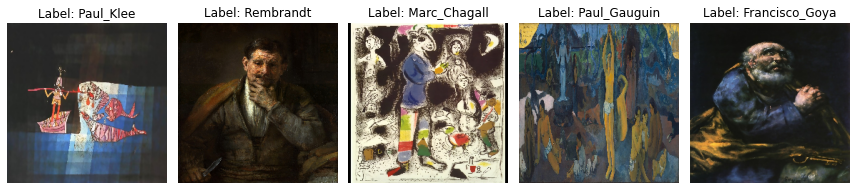

In [9]:
class_names = list(train_data.class_indices.keys())

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))

for i in range(5):
    index = np.random.randint(batch_size)
    image = train_data[0][0][index]
    label_index = np.argmax(train_data[0][1][index])
    label = class_names[label_index]
    axes[i].imshow(image)
    axes[i].set_title(f"Label: {label}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# 2. Model training

## 2.1 CNN-LSTM (Self-Proposed)

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, LSTM, Dense, Flatten, Dropout, MaxPooling2D, Activation, TimeDistributed, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.layers import InstanceNormalization
import numpy as np

model = Sequential()
model.add(Conv2D(32, (3,3), padding = 'same', input_shape=(224, 224, 3)))
model.add(InstanceNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64, (3,3), padding = 'same'))
model.add(InstanceNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128, (3, 3), padding='same'))
model.add(InstanceNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(256, (3, 3), padding='same'))
model.add(InstanceNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# model.add(Conv2D(512, (3,3), padding = 'same'))
# model.add(InstanceNormalization())
# model.add(Activation('relu'))
# model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128, (3,3), padding = 'same'))
model.add(InstanceNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Dense(64))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))

model.add(TimeDistributed(Flatten()))
model.add(LSTM(64))
model.add(Dense(8, activation='softmax')) # Number of classes

learning_rate = 0.001

optimizer = Adam(lr=learning_rate)

model.compile(loss='categorical_crossentropy', 
              optimizer=optimizer,
              metrics=['accuracy'])

model.summary()

history = model.fit(X_train, y_train, epochs=8, validation_data=(X_val, y_val))

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 instance_normalization_24 (  (None, 224, 224, 32)     64        
 InstanceNormalization)                                          
                                                                 
 activation_28 (Activation)  (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 instance_normalization_25 (  (None, 112, 112, 64)    

In [16]:
model.save("cnn_lstm.model")

INFO:tensorflow:Assets written to: cnn_lstm.model/assets


INFO:tensorflow:Assets written to: cnn_lstm.model/assets


### 2.1.1 Trained Model Performances

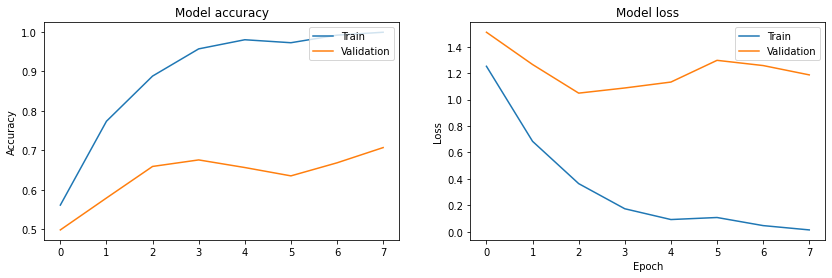

In [24]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(14, 4))

axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('Model accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].legend(['Train', 'Validation'], loc='upper right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('Model loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].legend(['Train', 'Validation'], loc='upper right')

plt.show()

7/7 [==============================] - 5s 666ms/step
F1-score: 0.708
Fbeta-score: 0.712
Accuracy: 0.713


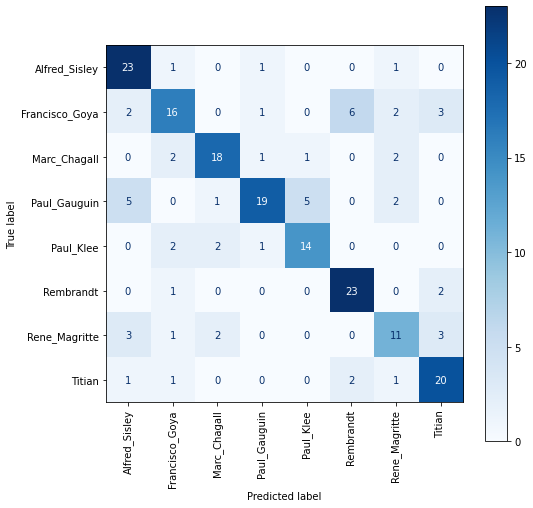

In [103]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, fbeta_score, accuracy_score
import matplotlib.pyplot as plt

y_pred = np.argmax(model.predict(X_test),axis=1)
y_true = np.argmax(y_test,axis=1)

y_pred_labels = list(map(lambda x: class_names[x], y_pred))
y_true_labels = list(map(lambda x: class_names[x], y_true))

cm = confusion_matrix(y_true_labels, y_pred_labels)

f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')
fbeta = fbeta_score(y_true_labels, y_pred_labels, beta=2, average='macro')
accuracy = accuracy_score(y_true_labels, y_pred_labels)

print("F1-score: {:.3f}".format(f1))
print("Fbeta-score: {:.3f}".format(fbeta))
print("Accuracy: {:.3f}".format(accuracy))

fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation='vertical')

plt.show()

array([4, 0, 3, 7, 4, 2, 3, 0, 0, 0, 3, 2, 1, 5, 4, 1, 7, 3, 6, 0, 0, 3,
       3, 7, 3, 5, 3, 2, 7, 6, 3, 7, 5, 4, 0, 7, 0, 4, 3, 5, 1, 0, 3, 1,
       2, 0, 3, 3, 1, 4, 5, 1, 2, 6, 1, 3, 5, 7, 4, 0, 6, 6, 3, 7, 1, 2,
       1, 5, 3, 1, 6, 1, 4, 0, 3, 1, 6, 3, 1, 3, 1, 6, 4, 3, 0, 0, 7, 1,
       5, 5, 4, 1, 1, 6, 3, 3, 1, 2, 7, 6, 5, 6, 3, 0, 2, 2, 6, 2, 5, 5,
       5, 5, 0, 0, 0, 4, 1, 7, 7, 2, 0, 7, 6, 5, 5, 2, 2, 7, 6, 5, 3, 6,
       0, 5, 5, 7, 1, 7, 7, 6, 1, 7, 1, 5, 1, 0, 3, 4, 1, 3, 4, 5, 6, 2,
       0, 6, 2, 1, 4, 2, 7, 1, 7, 2, 1, 1, 4, 3, 5, 2, 2, 4, 7, 7, 5, 6,
       4, 3, 0, 5, 4, 5, 1, 4, 0, 7, 2, 3, 6, 1, 7, 2, 2, 0, 0, 2, 3, 7,
       2, 3, 3, 5])

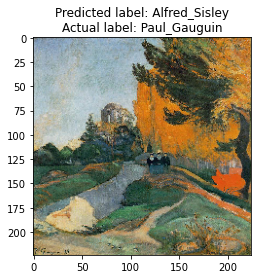

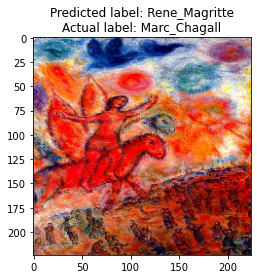

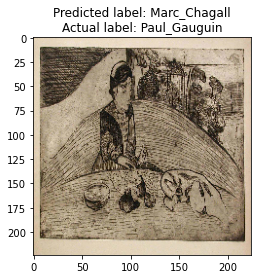

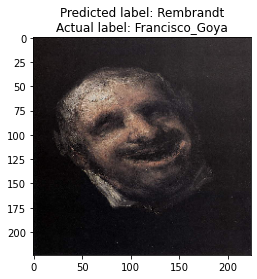

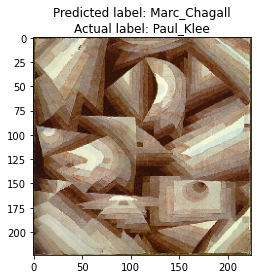

...

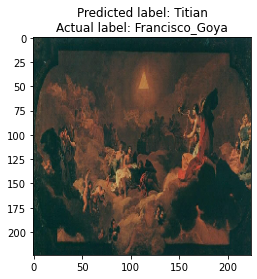

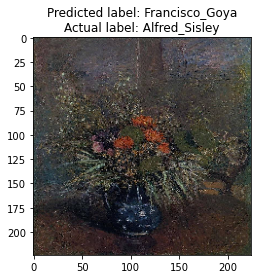

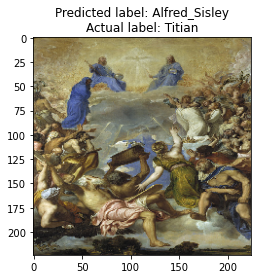

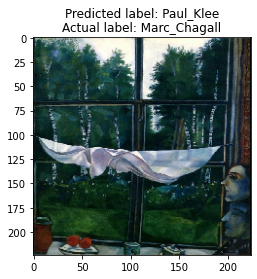

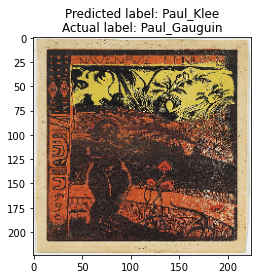

In [106]:
import numpy as np
import matplotlib.pyplot as plt


misclassified_indices = np.array(np.where(y_pred != y_true)[0])

misclassified_images = []
for i in misclassified_indices:
    img = X_test[i]
    y_pred_label = y_pred_labels[i]
    y_true_label = y_true_labels[i]
    misclassified_images.append((img, y_pred_label, y_true_label))

for img, y_pred_label, y_true_label in misclassified_images:
    fig, ax = plt.subplots()
    ax.imshow(img)
    ax.set_title('Predicted label: {}\nActual label: {}'.format(y_pred_label, y_true_label))
    plt.show()


## 2.2 CNN model (Self-proposed)

In [37]:
import tensorflow as tf
from tensorflow import keras

model2 = Sequential()
model2.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', 
                  padding="same",input_shape=(224, 224, 3), name="Block1_Conv1"))
model2.add(MaxPooling2D(pool_size=(3,3), name="Block1_Pool"))
model2.add(BatchNormalization(name="Block1_BatchNorm"))
                                    
model2.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding="same", name="Block2_Conv1"))
model2.add(MaxPooling2D(pool_size=(2,2), name="Block2_Pool"))
model2.add(BatchNormalization(name="Block2_BatchNorm"))
                                    
model2.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu', padding="same", name="Block3_Conv"))
model2.add(MaxPooling2D(pool_size=(2,2), name="Block3_Pool"))
model2.add(BatchNormalization(name="Block3_BatchNorm"))
                                    
model2.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding="same", name="Block4_Conv"))
model2.add(MaxPooling2D(pool_size=(2,2), name="Block4_Pool"))
model2.add(BatchNormalization(name="Block4_BatchNorm"))

model2.add(Flatten(name="Flatten_layer"))
model2.add(Dense(64, activation='relu', name="fc"))
model2.add(Dropout(0.2, name="Dropout"))
model2.add(Dense(8, activation='softmax', name="Prediction"))

model2.compile(
    optimizer=keras.optimizers.Adam(0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy']
)

history2 = model2.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    verbose=1
)

Epoch 1/10
137/137 [==============================] - 92s 665ms/step - loss: 1.3830 - accuracy: 0.5827 - val_loss: 4.4653 - val_accuracy: 0.2424
Epoch 2/10
137/137 [==============================] - 97s 708ms/step - loss: 0.5905 - accuracy: 0.7962 - val_loss: 3.9562 - val_accuracy: 0.2176
Epoch 3/10
137/137 [==============================] - 101s 738ms/step - loss: 0.3208 - accuracy: 0.8856 - val_loss: 1.9278 - val_accuracy: 0.5298
Epoch 4/10
137/137 [==============================] - 100s 732ms/step - loss: 0.1723 - accuracy: 0.9391 - val_loss: 1.4712 - val_accuracy: 0.6364
Epoch 5/10
137/137 [==============================] - 103s 751ms/step - loss: 0.1317 - accuracy: 0.9579 - val_loss: 1.6583 - val_accuracy: 0.6511
Epoch 6/10
137/137 [==============================] - 107s 782ms/step - loss: 0.1002 - accuracy: 0.9680 - val_loss: 1.6776 - val_accuracy: 0.6520
Epoch 7/10
137/137 [==============================] - 108s 791ms/step - loss: 0.1041 - accuracy: 0.9648 - val_loss: 2.2758 - v

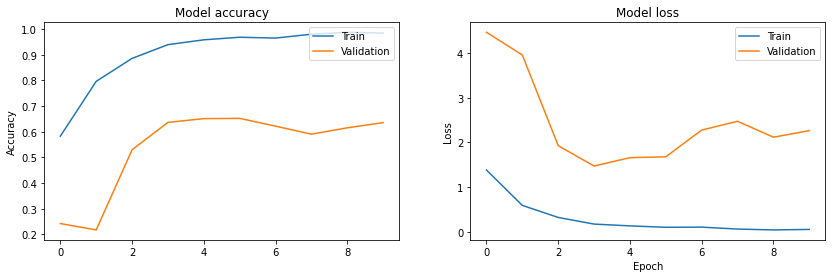

In [38]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(14, 4))

axs[0].plot(history2.history['accuracy'])
axs[0].plot(history2.history['val_accuracy'])
axs[0].set_title('Model accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].legend(['Train', 'Validation'], loc='upper right')

axs[1].plot(history2.history['loss'])
axs[1].plot(history2.history['val_loss'])
axs[1].set_title('Model loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].legend(['Train', 'Validation'], loc='upper right')

plt.show()

7/7 [==============================] - 2s 299ms/step
F1-score: 0.673
Fbeta-score: 0.670
Accuracy: 0.678


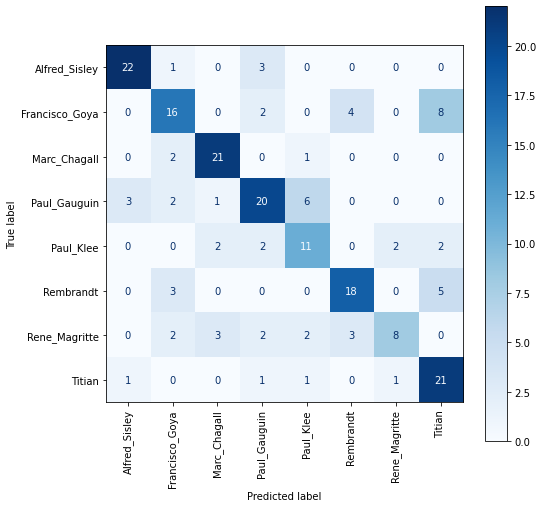

In [107]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, fbeta_score, accuracy_score
import matplotlib.pyplot as plt

y_pred = np.argmax(model2.predict(X_test),axis=1)
y_true = np.argmax(y_test,axis=1)

y_pred_labels = list(map(lambda x: class_names[x], y_pred))
y_true_labels = list(map(lambda x: class_names[x], y_true))

cm = confusion_matrix(y_true_labels, y_pred_labels)

f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')
fbeta = fbeta_score(y_true_labels, y_pred_labels, beta=2, average='macro')
accuracy = accuracy_score(y_true_labels, y_pred_labels)

print("F1-score: {:.3f}".format(f1))
print("Fbeta-score: {:.3f}".format(fbeta))
print("Accuracy: {:.3f}".format(accuracy))

fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation='vertical')

plt.show()

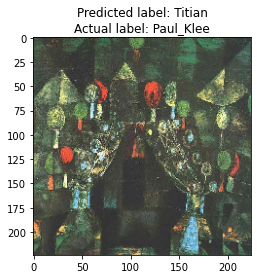

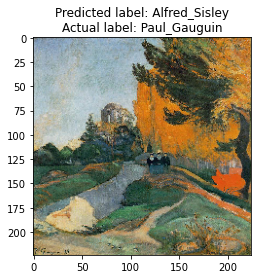

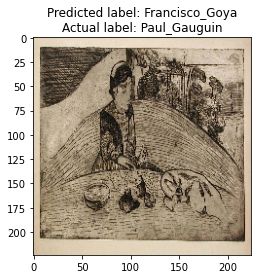

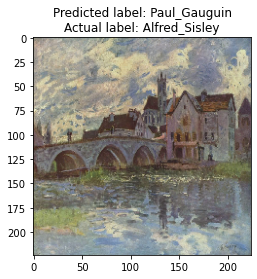

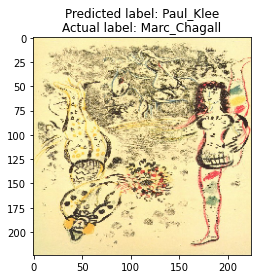

...

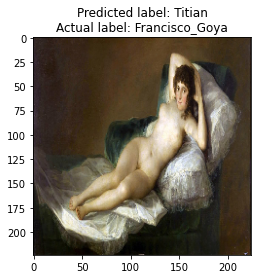

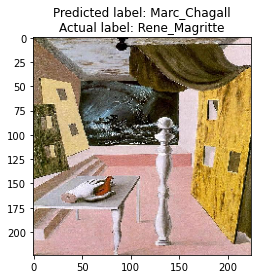

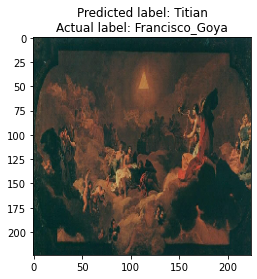

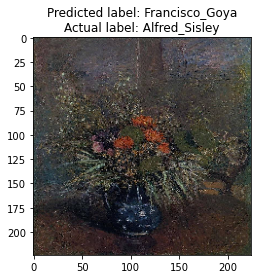

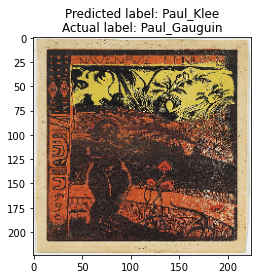

In [108]:
import numpy as np
import matplotlib.pyplot as plt


misclassified_indices = np.array(np.where(y_pred != y_true)[0])

misclassified_images = []
for i in misclassified_indices:
    img = X_test[i]
    y_pred_label = y_pred_labels[i]
    y_true_label = y_true_labels[i]
    misclassified_images.append((img, y_pred_label, y_true_label))

for img, y_pred_label, y_true_label in misclassified_images:
    fig, ax = plt.subplots()
    ax.imshow(img)
    ax.set_title('Predicted label: {}\nActual label: {}'.format(y_pred_label, y_true_label))
    plt.show()



## 2.3 AlexNet

In [41]:
model3 = Sequential()

model3.add(Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), 
                 activation='relu', input_shape=(224, 224, 3), padding="same", name="Block1_Conv"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), name="Block1_pool"))

model3.add(Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same", name="Block2_Conv"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), name="Block2_pool"))

model3.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", name="Block3_Conv1"))
model3.add(BatchNormalization())

model3.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", name="Block3_Conv2"))
model3.add(BatchNormalization())

model3.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", name="Block3_Conv3"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), name="Block3_pool"))

model3.add(Flatten())
model3.add(Dense(4096, activation='relu', name="fc1"))
model3.add(Dropout(0.5))

model3.add(Dense(4096, activation='relu', name="fc2"))
model3.add(Dropout(0.5))
model3.add(Dense(8, activation='softmax', name="prediction"))

model3.compile(
    optimizer=keras.optimizers.Adam(0.001), 
    loss='categorical_crossentropy', 
    metrics='accuracy'
)

history3 = model3.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    verbose=1
)

Epoch 1/10
137/137 [==============================] - 468s 3s/step - loss: 10.1628 - accuracy: 0.3162 - val_loss: 2.0393 - val_accuracy: 0.2718
Epoch 2/10
137/137 [==============================] - 491s 4s/step - loss: 1.9573 - accuracy: 0.4031 - val_loss: 1.8113 - val_accuracy: 0.3691
Epoch 3/10
 21/137 [===>..........................] - ETA: 6:34 - loss: 1.7533 - accuracy: 0.4717

KeyboardInterrupt: 

## 2.4 VGG16 

## 2.5 VGG19

# 3. Error Analysis